In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub

In [2]:
tf.__version__

'2.19.0'

In [3]:
device_list = tf.config.list_physical_devices()
if "GPU" in [device.device_type for device in device_list]:
  print(f"ok")
  print(f"accessible devices:\n{device_list}")
else:
  print(f"not ok")
  print(f"accessible devices:\n{device_list}")

ok
accessible devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
from google.colab import drive
drive.mount('/content/drive')

!tar -xf "/content/drive/MyDrive/dog breed id/version2_data/images.tar" -C "/content/"
!tar -xf "/content/drive/MyDrive/dog breed id/version2_data/annotation.tar" -C "/content/"
!tar -xf "/content/drive/MyDrive/dog breed id/version2_data/lists.tar" -C "/content/"


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import os

os.listdir(".")

['.config',
 'Annotation',
 'Images',
 'drive',
 'file_list.mat',
 'images_split',
 'test_list.mat',
 'train_list.mat',
 'sample_data']

In [6]:
import scipy

train_list = scipy.io.loadmat("train_list.mat")
test_list = scipy.io.loadmat("test_list.mat")
file_list = scipy.io.loadmat("file_list.mat")

train_list, type(train_list)

({'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sun Oct  9 08:36:13 2011',
  '__version__': '1.0',
  '__globals__': [],
  'file_list': array([[array(['n02085620-Chihuahua/n02085620_5927.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_4441.jpg'], dtype='<U38')],
         [array(['n02085620-Chihuahua/n02085620_1502.jpg'], dtype='<U38')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_6754.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_9333.jpg'], dtype='<U48')],
         [array(['n02116738-African_hunting_dog/n02116738_2503.jpg'], dtype='<U48')]],
        dtype=object),
  'annotation_list': array([[array(['n02085620-Chihuahua/n02085620_5927'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_4441'], dtype='<U34')],
         [array(['n02085620-Chihuahua/n02085620_1502'], dtype='<U34')],
         ...,
         [array(['n02116738-African_hunting_dog/n02116738_6754'], dtype=

In [7]:
train_list.keys()

dict_keys(['__header__', '__version__', '__globals__', 'file_list', 'annotation_list', 'labels'])

In [8]:
print(f"training {len(train_list['file_list'])}")
print(f"testing {len(test_list['file_list'])}")
print(f"full {len(file_list['file_list'])}")

training 12000
testing 8580
full 20580


In [9]:
train_list['file_list']

array([[array(['n02085620-Chihuahua/n02085620_5927.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_4441.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_1502.jpg'], dtype='<U38')],
       ...,
       [array(['n02116738-African_hunting_dog/n02116738_6754.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_9333.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_2503.jpg'], dtype='<U48')]],
      dtype=object)

In [10]:
train_list['file_list'][0][0][0]

np.str_('n02085620-Chihuahua/n02085620_5927.jpg')

In [11]:
train_file_list = list([item[0][0] for item in train_list["file_list"]])
test_file_list = list([item[0][0] for item in test_list["file_list"]])
full_file_list = list([item[0][0] for item in file_list["file_list"]])

In [12]:
len(train_file_list), len(test_file_list), len(full_file_list)

(12000, 8580, 20580)

In [13]:
train_file_list[0]

np.str_('n02085620-Chihuahua/n02085620_5927.jpg')

In [14]:
len(set(train_file_list).intersection(test_file_list))

0

In [15]:
os.listdir('Annotation')[:10]

['n02089867-Walker_hound',
 'n02086079-Pekinese',
 'n02093647-Bedlington_terrier',
 'n02110958-pug',
 'n02101006-Gordon_setter',
 'n02093754-Border_terrier',
 'n02101388-Brittany_spaniel',
 'n02109961-Eskimo_dog',
 'n02116738-African_hunting_dog',
 'n02095889-Sealyham_terrier']

In [16]:
from pathlib import Path

def count_subfolders(directory_path: str) -> int:
  return len([name for name in Path(directory_path).iterdir() if name.is_dir()])

In [17]:
directory_path="Annotation"
folder_count=count_subfolders(directory_path)
print(f"Number of subfolders in {directory_path} directory: {folder_count}")

Number of subfolders in Annotation directory: 120


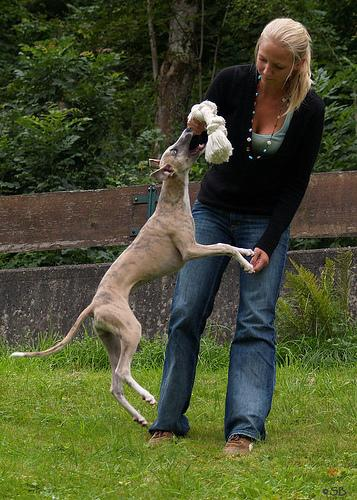

In [18]:
from IPython.display import Image
Image(Path('Images',train_file_list[2137]))

In [19]:
image_folders=os.listdir('Images')
image_folders[:10]

['n02089867-Walker_hound',
 'n02086079-Pekinese',
 'n02093647-Bedlington_terrier',
 'n02110958-pug',
 'n02101006-Gordon_setter',
 'n02093754-Border_terrier',
 'n02101388-Brittany_spaniel',
 'n02109961-Eskimo_dog',
 'n02116738-African_hunting_dog',
 'n02095889-Sealyham_terrier']

In [20]:
folder_to_class_name_dict = {}
for folder_name in image_folders:
    remainder = folder_name.split('-', 1)[1]
    class_name = remainder.replace('_', ' ').replace('-', ' ').lower()
    folder_to_class_name_dict[folder_name] = class_name

In [21]:
list(folder_to_class_name_dict.items())[:10]

[('n02089867-Walker_hound', 'walker hound'),
 ('n02086079-Pekinese', 'pekinese'),
 ('n02093647-Bedlington_terrier', 'bedlington terrier'),
 ('n02110958-pug', 'pug'),
 ('n02101006-Gordon_setter', 'gordon setter'),
 ('n02093754-Border_terrier', 'border terrier'),
 ('n02101388-Brittany_spaniel', 'brittany spaniel'),
 ('n02109961-Eskimo_dog', 'eskimo dog'),
 ('n02116738-African_hunting_dog', 'african hunting dog'),
 ('n02095889-Sealyham_terrier', 'sealyham terrier')]

In [22]:
dog_names=sorted(list(folder_to_class_name_dict.values()))

In [23]:
dog_names[:10]

['affenpinscher',
 'afghan hound',
 'african hunting dog',
 'airedale',
 'american staffordshire terrier',
 'appenzeller',
 'australian terrier',
 'basenji',
 'basset',
 'beagle']

In [24]:
import random
from typing import List, Dict

def plot_25_random_images_from_path_list(path_list: List[Path],
                                         extract_title: bool=True) -> None:
  fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(10, 10))

  samples = random.sample(path_list, 25)

  for i, ax in enumerate(axes.flat):
    sample_path = samples[i]

    if extract_title:
      sample_title = folder_to_class_name_dict[sample_path.parent.stem]
    else:
      sample_title = sample_path.parent.stem

    ax.imshow(plt.imread(sample_path))

    ax.set_title(sample_title)
    ax.axis("off")

  plt.show()

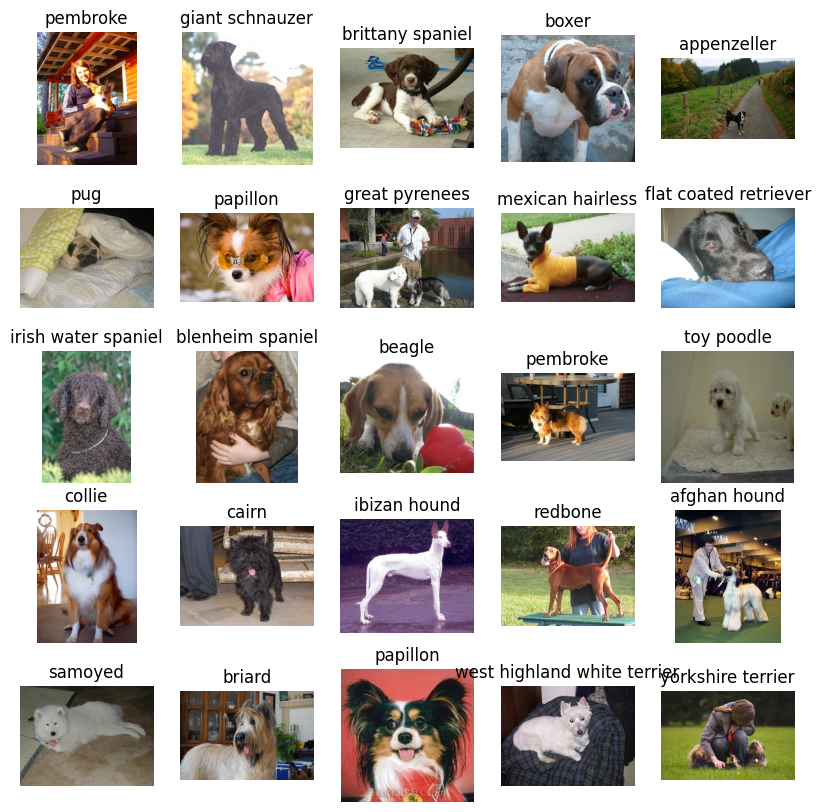

In [25]:
plot_25_random_images_from_path_list(path_list=[Path("Images") / Path(file) for file in train_file_list])

In [26]:
def count_images_in_subdirs(target_directory: str) -> List[Dict[str, int]]:
    images_dir = Path(target_directory)
    image_class_dirs = [directory for directory in images_dir.iterdir() if directory.is_dir()]

    image_class_counts = []

    for image_class_dir in image_class_dirs:

        class_name = image_class_dir.stem

        image_count = len(list(image_class_dir.rglob("*.jpg")))

        image_class_counts.append({"class_name": class_name,
                                   "image_count": image_count})

    return image_class_counts

In [27]:
image_class_counts = count_images_in_subdirs("Images")
image_class_counts[:10]

[{'class_name': 'n02089867-Walker_hound', 'image_count': 153},
 {'class_name': 'n02086079-Pekinese', 'image_count': 149},
 {'class_name': 'n02093647-Bedlington_terrier', 'image_count': 182},
 {'class_name': 'n02110958-pug', 'image_count': 200},
 {'class_name': 'n02101006-Gordon_setter', 'image_count': 153},
 {'class_name': 'n02093754-Border_terrier', 'image_count': 172},
 {'class_name': 'n02101388-Brittany_spaniel', 'image_count': 152},
 {'class_name': 'n02109961-Eskimo_dog', 'image_count': 150},
 {'class_name': 'n02116738-African_hunting_dog', 'image_count': 169},
 {'class_name': 'n02095889-Sealyham_terrier', 'image_count': 202}]

In [28]:
image_counts_df = pd.DataFrame(image_class_counts).sort_values(by="image_count", ascending=False)
image_counts_df.head()

,class_name,image_count
108,n02085936-Maltese_dog,252
107,n02088094-Afghan_hound,239
72,n02092002-Scottish_deerhound,232
51,n02112018-Pomeranian,219
67,n02107683-Bernese_mountain_dog,218


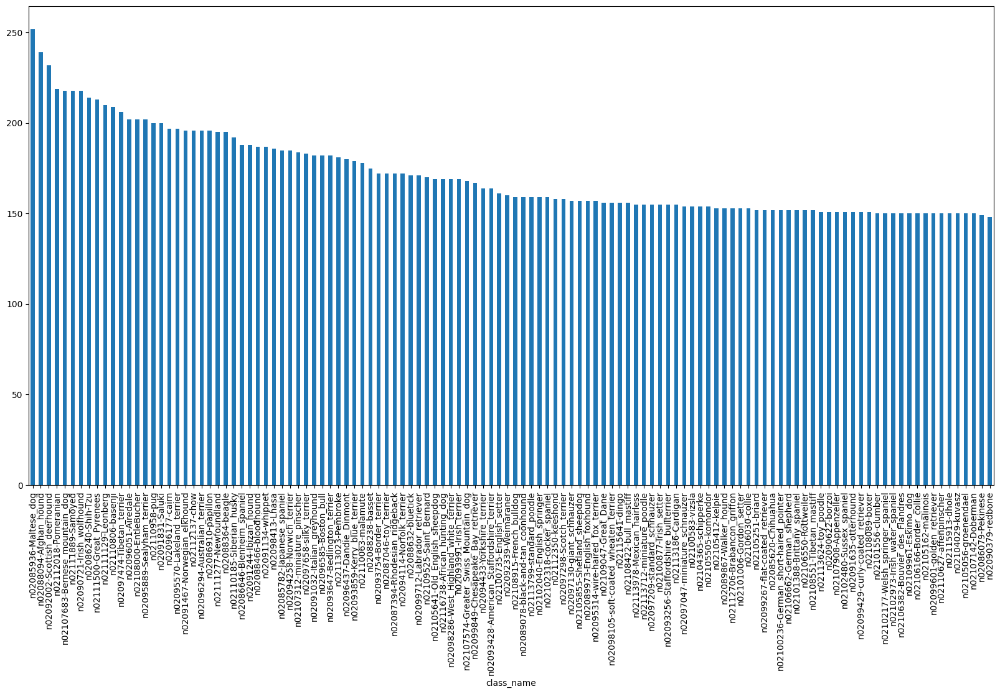

In [29]:
plt.figure(figsize=(20,10))
image_counts_df.plot(kind='bar',
                     x='class_name',
                     y='image_count',
                     legend=False,
                     ax=plt.gca())
plt.show()

In [30]:
image_counts_df.describe()

,image_count
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


In [31]:
images_split_dir = Path("images_split")

train_dir = images_split_dir / "train"
test_dir = images_split_dir / "test"

for dog_name in dog_names:
  train_class_dir = train_dir / dog_name
  test_class_dir = test_dir / dog_name

In [32]:
from shutil import copy2
from tqdm.auto import tqdm

def copy_files_to_target_dir(file_list: list[str],
                             target_dir: str,
                             images_dir: str = "Images",
                             verbose: bool = False) -> None:

    for file in tqdm(file_list):

      source_file_path = Path(images_dir) / Path(file)

      file_class_name = folder_to_class_name_dict[Path(file).parts[0]]

      file_image_name = Path(file).name

      destination_file_path = Path(target_dir) / file_class_name / file_image_name

      destination_file_path.parent.mkdir(parents=True, exist_ok=True)

      if verbose:
        print(f"copying {source_file_path} to {destination_file_path}")

      copy2(src=source_file_path, dst=destination_file_path)

In [33]:
copy_files_to_target_dir(file_list=train_file_list,
                         target_dir=train_dir,
                         verbose=1)

  0%|          | 0/12000 [00:00<?, ?it/s]

Streaming output truncated to the last 5000 lines.
copying Images/n02102973-Irish_water_spaniel/n02102973_2442.jpg to images_split/train/irish water spaniel/n02102973_2442.jpg
copying Images/n02102973-Irish_water_spaniel/n02102973_4794.jpg to images_split/train/irish water spaniel/n02102973_4794.jpg
copying Images/n02102973-Irish_water_spaniel/n02102973_220.jpg to images_split/train/irish water spaniel/n02102973_220.jpg
copying Images/n02102973-Irish_water_spaniel/n02102973_3978.jpg to images_split/train/irish water spaniel/n02102973_3978.jpg
copying Images/n02102973-Irish_water_spaniel/n02102973_634.jpg to images_split/train/irish water spaniel/n02102973_634.jpg
copying Images/n02102973-Irish_water_spaniel/n02102973_4304.jpg to images_split/train/irish water spaniel/n02102973_4304.jpg
copying Images/n02102973-Irish_water_spaniel/n02102973_3344.jpg to images_split/train/irish water spaniel/n02102973_3344.jpg
copying Images/n02102973-Irish_water_spaniel/n02102973_1140.jpg to images_spli

In [34]:
copy_files_to_target_dir(file_list=test_file_list,
                         target_dir=test_dir)

  0%|          | 0/8580 [00:00<?, ?it/s]

In [35]:
train_image_paths = list(train_dir.rglob("*.jpg"))
test_image_paths = list(test_dir.rglob("*.jpg"))

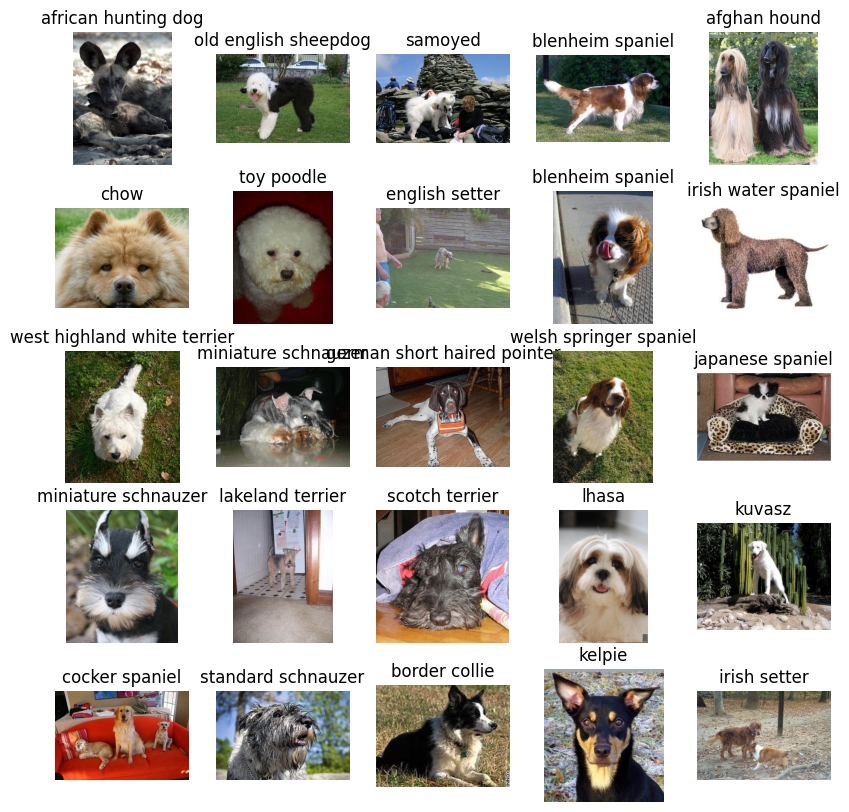

In [36]:
plot_25_random_images_from_path_list(path_list=train_image_paths,
                                     extract_title=False)

In [37]:
train_10_percent_dir = images_split_dir / "train_10_percent"
train_10_percent_dir.mkdir(parents=True, exist_ok=True)

In [38]:
os.listdir(images_split_dir)

['test', 'train_10_percent', 'train']

In [39]:
import random

random.seed(42)

for class_dir in tqdm(train_dir.iterdir(), desc="creating per-class 10% split"):
    if class_dir.is_dir():

        image_paths = list(class_dir.glob("*.jpg"))

        k = max(1, int(0.1 * len(image_paths)))
        sampled_paths = random.sample(image_paths, k=k)

        target_class_dir = train_10_percent_dir / class_dir.name
        target_class_dir.mkdir(parents=True, exist_ok=True)

        for src_path in sampled_paths:
            dst_path = target_class_dir / src_path.name
            copy2(src=src_path, dst=dst_path)

creating per-class 10% split: 0it [00:00, ?it/s]

In [40]:
train_10_percent_image_class_counts = count_images_in_subdirs(train_10_percent_dir)
train_10_percent_image_class_counts_df = pd.DataFrame(train_10_percent_image_class_counts).sort_values("image_count", ascending=True)
train_10_percent_image_class_counts_df.head()

,class_name,image_count
0,beagle,10
1,norwegian elkhound,10
2,irish wolfhound,10
3,giant schnauzer,10
4,boxer,10


In [41]:
print(len(train_10_percent_image_class_counts_df))

120


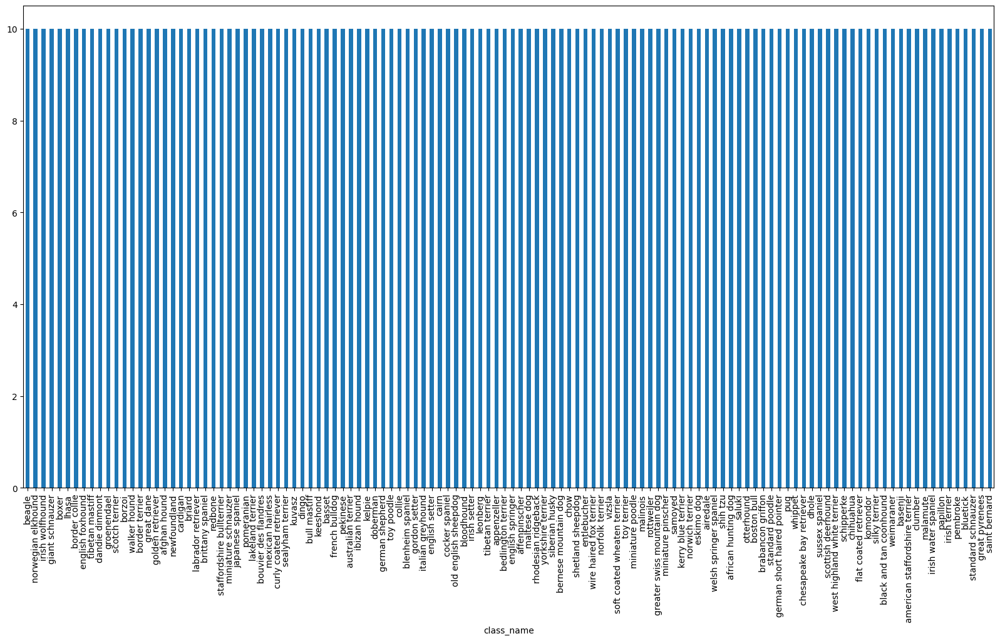

In [42]:
plt.figure(figsize=(20,10))
train_10_percent_image_class_counts_df.plot(kind='bar',
                     x='class_name',
                     y='image_count',
                     legend=False,
                     ax=plt.gca())
plt.show()

In [43]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 42

train_10_percent_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_10_percent_dir,
    label_mode="categorical",
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=True,
    seed=SEED
)

train_ds = tf.keras.utils.image_dataset_from_directory(
    directory=train_dir,
    label_mode="categorical",
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=True,
    seed=SEED
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    directory=test_dir,
    label_mode="categorical",
    batch_size=BATCH_SIZE,
    image_size=IMG_SIZE,
    shuffle=False,
    seed=SEED
)

Found 1200 files belonging to 120 classes.
Found 12000 files belonging to 120 classes.
Found 8580 files belonging to 120 classes.


In [44]:
train_10_percent_ds

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>

In [45]:
image_batch, label_batch = next(iter(train_ds))
image_batch.shape, label_batch.shape

(TensorShape([32, 224, 224, 3]), TensorShape([32, 120]))

In [46]:
print(f"single image tensor:\n{image_batch[0]}\n")
print(f"single label tensor: {label_batch[0]}")
print(f"single sample class name: {dog_names[tf.argmax(label_batch[0])]}")

single image tensor:
[[[196.61607  174.61607  160.61607 ]
  [197.84822  175.84822  161.84822 ]
  [200.       178.       164.      ]
  ...
  [ 60.095097  79.75804   45.769207]
  [ 61.83293   71.22575   63.288315]
  [ 77.65755   83.65755   81.65755 ]]

 [[196.       174.       160.      ]
  [197.83876  175.83876  161.83876 ]
  [199.07945  177.07945  163.07945 ]
  ...
  [ 94.573715 110.55229   83.59694 ]
  [125.869865 135.26268  127.33472 ]
  [122.579605 128.5796   126.579605]]

 [[195.73691  173.73691  159.73691 ]
  [196.896    174.896    160.896   ]
  [199.       177.       163.      ]
  ...
  [ 26.679413  38.759026  20.500835]
  [ 24.372307  31.440136  26.675896]
  [ 20.214453  26.214453  24.214453]]

 ...

 [[ 61.57369   70.18976  104.72547 ]
  [189.91965  199.61607  213.28572 ]
  [247.26637  255.       252.70387 ]
  ...
  [113.40158   83.40158   57.40158 ]
  [110.75214   78.75214   53.752136]
  [107.37048   75.37048   50.370483]]

 [[ 61.27007   69.88614  104.42185 ]
  [188.93079  19

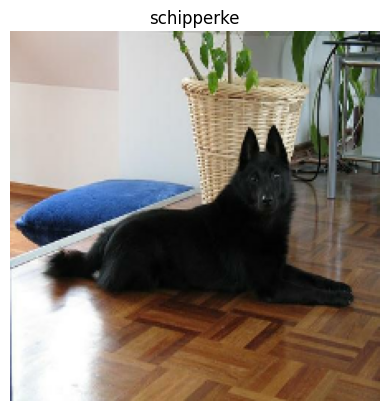

In [47]:
plt.imshow(image_batch[0].numpy().astype("uint8"))
plt.title(dog_names[tf.argmax(label_batch[0])])
plt.axis("off");

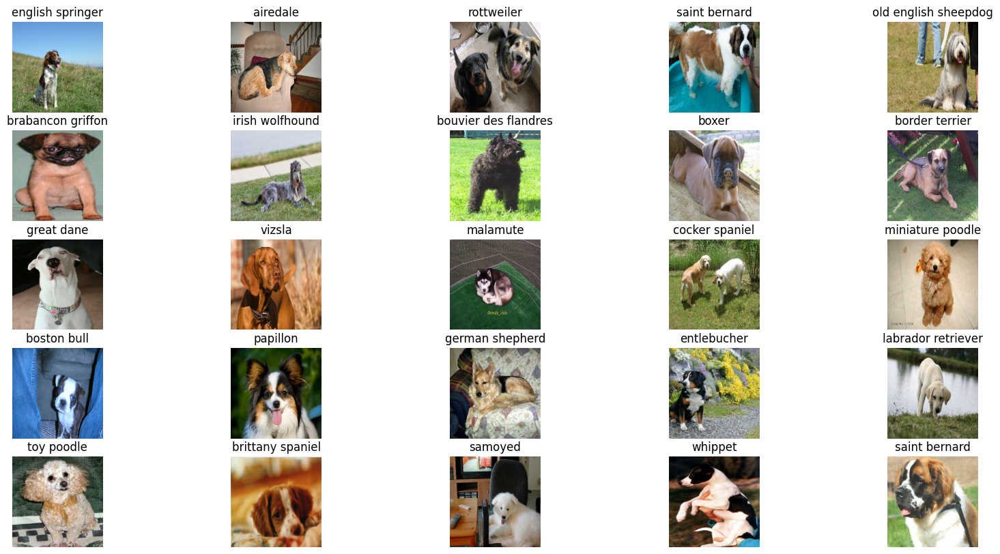

In [48]:
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(20, 10))

for images, labels in train_ds.take(count=1):
  for i, ax in enumerate(axes.flat):
    ax.imshow(images[i].numpy().astype("uint8"))
    ax.set_title(dog_names[tf.argmax(labels[i])])
    ax.axis("off")

In [49]:
train_ds.file_paths[:10]

['images_split/train/boston bull/n02096585_1753.jpg',
 'images_split/train/kerry blue terrier/n02093859_855.jpg',
 'images_split/train/border terrier/n02093754_2281.jpg',
 'images_split/train/rottweiler/n02106550_11823.jpg',
 'images_split/train/airedale/n02096051_5884.jpg',
 'images_split/train/scotch terrier/n02097298_7442.jpg',
 'images_split/train/great pyrenees/n02111500_7420.jpg',
 'images_split/train/pekinese/n02086079_20762.jpg',
 'images_split/train/brabancon griffon/n02112706_1419.jpg',
 'images_split/train/german shepherd/n02106662_1451.jpg']

In [50]:
class_names = train_ds.class_names
class_names[:10]

['affenpinscher',
 'afghan hound',
 'african hunting dog',
 'airedale',
 'american staffordshire terrier',
 'appenzeller',
 'australian terrier',
 'basenji',
 'basset',
 'beagle']

In [51]:
AUTOTUNE = tf.data.AUTOTUNE

train_10_percent_ds = train_10_percent_ds.shuffle(buffer_size=10*BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)
train_ds = train_ds.shuffle(buffer_size=100*BATCH_SIZE).prefetch(buffer_size=AUTOTUNE)

test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)

In [52]:
INPUT_SHAPE = (*IMG_SIZE, 3)

base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=True,
    include_preprocessing=True,
    weights="imagenet",
    input_shape=INPUT_SHAPE)

In [53]:
base_model.summary()

Model: "efficientnetv2-b0"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          0 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │        864 │ normalization[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      4,608 │ stem_activation[… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 112, 112,  │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 112, 112,  │          0 │ block1a_project_… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, 56, 56,    │      9,216 │ block1a_project_… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, 56, 56,    │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, 56, 56,    │          0 │ block2a_expand_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_co… │ (None, 56, 56,    │      2,048 │ block2a_expand_a… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_project_bn  │ (None, 56, 56,    │        128 │ block2a_project_… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_conv │ (None, 56, 56,    │     36,864 │ block2a_project_… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_bn   │ (None, 56, 56,    │        512 │ block2b_expand_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2b_expand_act… │ (None, 56, 56,    │          0 │ block2b_expand_b

 Total params: 7,200,312 (27.47 MB)

 Trainable params: 7,139,704 (27.24 MB)

 Non-trainable params: 60,608 (236.75 KB)

In [54]:
print(f"number of layers in base_model {len(base_model.layers)}")

number of layers in base_model 273


In [55]:
base_model.input_shape, base_model.output_shape

((None, 224, 224, 3), (None, 1000))

In [56]:
# base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
#     include_top=True,
#     include_preprocessing=True,
#     weights="imagenet",
#     input_shape=INPUT_SHAPE,
#     classes=len(dog_names)
# )

# base_model.output_shape

In [57]:
base_model=tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=False,
    include_preprocessing=True,
    weights="imagenet",
    input_shape=INPUT_SHAPE,
)

base_model.output_shape

(None, 7, 7, 1280)

In [58]:
print(f"number of layers in base_model {len(base_model.layers)}")

number of layers in base_model 270


In [59]:
base_model.count_params()

5919312

In [60]:
def count_parameters(model, print_output=True):
  trainable_parameters = np.sum([np.prod(layer.shape) for layer in model.trainable_weights])
  non_trainable_parameters = np.sum([np.prod(layer.shape) for layer in model.non_trainable_weights])
  total_parameters = trainable_parameters + non_trainable_parameters
  if print_output:
    print(f"model {model.name} parameter counts:")
    print(f"total parameters: {total_parameters}")
    print(f"trainable parameters: {trainable_parameters}")
    print(f"non-trainable parameters: {non_trainable_parameters}")
  else:
    return total_parameters, trainable_parameters, non_trainable_parameters

count_parameters(model=base_model, print_output=True)

model efficientnetv2-b0 parameter counts:
total parameters: 5919312
trainable parameters: 5858704
non-trainable parameters: 60608


In [61]:
base_model.trainable = False

count_parameters(model=base_model, print_output=True)

model efficientnetv2-b0 parameter counts:
total parameters: 5919312.0
trainable parameters: 0.0
non-trainable parameters: 5919312


In [62]:
# feature_extraction=base_model(image_batch[0])
# feature_extraction

In [63]:
shape_of_image_without_batch = image_batch[0].shape

shape_of_image_with_batch = tf.expand_dims(input=image_batch[0], axis=0).shape

print(f"shape of image without batch: {shape_of_image_without_batch}")
print(f"shape of image with batch: {shape_of_image_with_batch}")

shape of image without batch: (224, 224, 3)
shape of image with batch: (1, 224, 224, 3)


In [64]:
feature_extraction = base_model(tf.expand_dims(image_batch[0], axis=0))
feature_extraction

<tf.Tensor: shape=(1, 7, 7, 1280), dtype=float32, numpy=
array([[[[-2.19177082e-01, -3.44185606e-02, -1.40321627e-01, ...,
          -1.44454509e-01, -2.73809791e-01, -7.41251782e-02],
         [-8.69670585e-02, -6.48750588e-02, -2.14547202e-01, ...,
          -4.57206406e-02, -2.77900130e-01, -8.20886344e-02],
         [-2.76872933e-01, -8.26781392e-02, -3.85151207e-02, ...,
          -2.72129059e-01, -2.52802223e-01, -2.28106007e-01],
         ...,
         [-1.01603933e-01, -3.55146267e-02, -2.23026931e-01, ...,
          -2.26227745e-01, -8.61772522e-02, -1.60451025e-01],
         [-5.87607436e-02, -4.65544593e-03, -1.06193364e-01, ...,
          -2.87548564e-02, -9.06914845e-02, -1.82624385e-01],
         [-6.27618283e-02, -1.38620916e-03,  1.52700013e-02, ...,
          -7.85450079e-03, -1.84584662e-01, -2.62404889e-01]],

        [[-2.17334077e-01, -1.10280894e-01, -2.74605244e-01, ...,
          -2.22405359e-01, -2.74738282e-01, -1.01998910e-01],
         [-1.40700579e-01, -1.6

In [65]:
feature_extraction.shape

TensorShape([1, 7, 7, 1280])

In [66]:
num_input_features = 224*224*3
feature_extraction_features = 1*7*7*1280

num_input_features / feature_extraction_features

2.4

In [67]:
feature_vector = tf.keras.layers.GlobalAveragePooling2D()(feature_extraction)
feature_vector

<tf.Tensor: shape=(1, 1280), dtype=float32, numpy=
array([[-0.115219  , -0.04476556, -0.1247655 , ..., -0.09118074,
        -0.08420829, -0.07769412]], dtype=float32)>

In [68]:
feature_vector.shape

TensorShape([1, 1280])

In [69]:
feature_vector_features = 1*1280

print(f"input -> feature extraction reduction factor: {num_input_features / feature_extraction_features}")
print(f"feature extraction -> feature vector reduction factor: {feature_extraction_features / feature_vector_features}")
print(f"input -> feature extraction -> feature vector reduction factor: {num_input_features / feature_vector_features}")

input -> feature extraction reduction factor: 2.4
feature extraction -> feature vector reduction factor: 49.0
input -> feature extraction -> feature vector reduction factor: 117.6


In [70]:
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=False,
    weights="imagenet",
    input_shape=INPUT_SHAPE,
    pooling="avg",
    include_preprocessing=True,
)

base_model.output_shape

(None, 1280)

In [71]:
base_model.trainable = False

count_parameters(model=base_model, print_output=True)

model efficientnetv2-b0 parameter counts:
total parameters: 5919312.0
trainable parameters: 0.0
non-trainable parameters: 5919312


In [72]:
feature_vector_2 = base_model(tf.expand_dims(image_batch[0], axis=0))
feature_vector_2

<tf.Tensor: shape=(1, 1280), dtype=float32, numpy=
array([[-0.115219  , -0.04476556, -0.1247655 , ..., -0.09118074,
        -0.08420829, -0.07769412]], dtype=float32)>

In [73]:
np.all(feature_vector == feature_vector_2)

np.True_

In [74]:
tf.random.set_seed(42)
sequential_model = tf.keras.Sequential([base_model,
                                        tf.keras.layers.Dense(units=len(dog_names),
                                                              activation="softmax")])
sequential_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetv2-b0 (Functional)  │ (None, 1280)           │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,073,032 (23.17 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [75]:
sequential_model.input_shape

(None, 224, 224, 3)

In [76]:
sequential_model.output_shape

(None, 120)

In [77]:
single_image_input = tf.expand_dims(image_batch[0], axis=0)

single_image_output_sequential = sequential_model(single_image_input)

single_image_output_sequential

<tf.Tensor: shape=(1, 120), dtype=float32, numpy=
array([[0.01060581, 0.00639821, 0.00868515, 0.00471645, 0.01114807,
        0.00898894, 0.00489485, 0.00771817, 0.01056224, 0.01634304,
        0.00852709, 0.00539822, 0.00666194, 0.00730689, 0.0049861 ,
        0.00807102, 0.00790613, 0.01074613, 0.01151005, 0.0103171 ,
        0.01305501, 0.01618141, 0.00916142, 0.00793765, 0.00427931,
        0.00725912, 0.01303101, 0.00615446, 0.01081458, 0.00981578,
        0.00856256, 0.00861733, 0.00551807, 0.01208062, 0.00985249,
        0.00989539, 0.00629904, 0.00773023, 0.0033302 , 0.00836892,
        0.00974096, 0.00725953, 0.01001809, 0.00812563, 0.00604247,
        0.00508693, 0.00814875, 0.01209784, 0.00365341, 0.00914598,
        0.0126996 , 0.00740704, 0.00865527, 0.0046712 , 0.0027469 ,
        0.01013211, 0.00377471, 0.00830216, 0.00997158, 0.01245063,
        0.00490828, 0.0052089 , 0.00798771, 0.00930641, 0.0099082 ,
        0.00545222, 0.00634916, 0.00824862, 0.00583491, 0.00625035

In [78]:
np.sum(single_image_output_sequential)

np.float32(1.0)

In [79]:
highest_value_index_sequential_model_output=np.argmax(single_image_output_sequential)
highest_value_sequential_model_output = np.max(single_image_output_sequential)

print(f"highest value index: {highest_value_index_sequential_model_output} ({dog_names[highest_value_index_sequential_model_output]})")
print(f"prediction probability: {highest_value_sequential_model_output}")

highest value index: 9 (beagle)
prediction probability: 0.01634303666651249


In [80]:
print(f"predicted value: {highest_value_index_sequential_model_output}")
print(f"actual value: {tf.argmax(label_batch[0]).numpy()}")

predicted value: 9
actual value: 95


In [81]:
sequential_model_predicted_label = class_names[tf.argmax(sequential_model(tf.expand_dims(image_batch[0], axis=0)), axis=1).numpy()[0]]

single_image_ground_truth_label = class_names[tf.argmax(label_batch[0])]

print(f"sequential model predicted label: {sequential_model_predicted_label}")
print(f"ground truth label: {single_image_ground_truth_label}")

sequential model predicted label: beagle
ground truth label: schipperke


In [82]:
inputs = tf.keras.Input(shape=INPUT_SHAPE)

x = base_model(inputs, training=False)

outputs = tf.keras.layers.Dense(units=len(class_names),
                                activation="softmax",
                                name="output_layer")(x)

functional_model = tf.keras.Model(inputs=inputs,
                                  outputs=outputs,
                                  name="functional_model")

functional_model.summary()

Model: "functional_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 1280)           │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,073,032 (23.17 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [83]:
single_image_output_functional = functional_model(single_image_input)

highest_value_index_functional_model_output = np.argmax(single_image_output_functional)
highest_value_functional_model_output = np.max(single_image_output_functional)

highest_value_index_functional_model_output, highest_value_functional_model_output

(np.int64(34), np.float32(0.019342443))

In [84]:
def create_model(include_top: bool = False,
                 num_classes: int = 1000,
                 input_shape: tuple[int, int, int] = (224, 224, 3),
                 include_preprocessing: bool = True,
                 trainable: bool = False,
                 dropout: float = 0.2,
                 model_name: str = "model") -> tf.keras.Model:

  base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(
    include_top=include_top,
    weights="imagenet",
    input_shape=input_shape,
    include_preprocessing=include_preprocessing,
    pooling="avg"
  )

  base_model.trainable = trainable

  inputs = tf.keras.Input(shape=input_shape, name="input_layer")

  x = base_model(inputs, training=trainable)

  outputs = tf.keras.layers.Dense(units=num_classes,
                                  activation="softmax",
                                  name="output_layer")(x)

  model = tf.keras.Model(inputs=inputs,
                         outputs=outputs,
                         name=model_name)

  return model

In [85]:
model_0 = create_model(num_classes=len(class_names), model_name="model_0")
model_0.summary()

Model: "model_0"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 1280)           │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,073,032 (23.17 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [86]:
for layer in model_0.layers:
  print(layer.name, layer.trainable)

input_layer True
efficientnetv2-b0 False
output_layer True


In [87]:
model_0 = create_model(num_classes=len(class_names),
                       model_name="model_0")

In [88]:
model_0.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
                metrics=["accuracy"])

In [89]:
def create_and_compile(num_classes: int,
                       learning_rate: float = 0.001,
                       loss: str = "categorical_crossentropy",
                       metrics: list = ["accuracy"]):

    model = create_model(num_classes=num_classes)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss=loss,
        metrics=metrics
    )

    return model

In [90]:
epochs = 5
history_0 = model_0.fit(x=train_10_percent_ds,
                        epochs=epochs,
                        validation_data=test_ds)

Epoch 1/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 94s 2s/step - accuracy: 0.1353 - loss: 4.4175 - val_accuracy: 0.6193 - val_loss: 3.0070
Epoch 2/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 82s 583ms/step - accuracy: 0.7673 - loss: 2.4509 - val_accuracy: 0.7748 - val_loss: 1.8260
Epoch 3/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 15s 376ms/step - accuracy: 0.9120 - loss: 1.3250 - val_accuracy: 0.8084 - val_loss: 1.2599
Epoch 4/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 28s 585ms/step - accuracy: 0.9505 - loss: 0.7924 - val_accuracy: 0.8227 - val_loss: 0.9872
Epoch 5/5
38/38 ━━━━━━━━━━━━━━━━━━━━ 16s 380ms/step - accuracy: 0.9653 - loss: 0.5490 - val_accuracy: 0.8323 - val_loss: 0.8460


In [91]:
history_0.history

{'accuracy': [0.2591666579246521,
  0.7825000286102295,
  0.909166693687439,
  0.9483333230018616,
  0.9616666436195374],
 'loss': [4.010316371917725,
  2.1943416595458984,
  1.2032923698425293,
  0.7488390207290649,
  0.5278460383415222],
 'val_accuracy': [0.619347333908081,
  0.7748251557350159,
  0.8083916306495667,
  0.8227272629737854,
  0.8322843909263611],
 'val_loss': [3.006998062133789,
  1.8260401487350464,
  1.2599316835403442,
  0.9872022271156311,
  0.8460445404052734]}

In [90]:
def plot_model_loss_curves(history: tf.keras.callbacks.History) -> None:

  acc = history.history["accuracy"]
  val_acc = history.history["val_accuracy"]

  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  epochs_range = range(len(acc))

  plt.figure(figsize=(20, 10))
  plt.subplot(1, 2, 1)
  plt.plot(epochs_range, acc, label="training accuracy")
  plt.plot(epochs_range, val_acc, label="validation accuracy")
  plt.legend(loc="lower right")
  plt.title("training and validation accuracy")
  plt.xlabel("epoch")
  plt.ylabel("accuracy")

  plt.subplot(1, 2, 2)
  plt.plot(epochs_range, loss, label="training loss")
  plt.plot(epochs_range, val_loss, label="validation loss")
  plt.legend(loc="upper right")
  plt.title("training and validation loss")
  plt.xlabel("epoch")
  plt.ylabel("loss")

  plt.show()

In [ ]:
plot_model_loss_curves(history=history_0)

In [93]:
model_0_results = model_0.evaluate(x=test_ds)
model_0_results

269/269 ━━━━━━━━━━━━━━━━━━━━ 13s 49ms/step - accuracy: 0.8536 - loss: 0.7942


[0.8460445404052734, 0.8322843909263611]

In [93]:
model_1 = create_model(num_classes=len(class_names),
                       model_name="model_1")

model_1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                loss="categorical_crossentropy",
                metrics=["accuracy"])

epochs=5
history_1 = model_1.fit(x=train_ds,
                        epochs=epochs,
                        validation_data=test_ds)

Epoch 1/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 113s 147ms/step - accuracy: 0.5638 - loss: 2.3949 - val_accuracy: 0.8720 - val_loss: 0.5044
Epoch 2/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.8845 - loss: 0.4545 - val_accuracy: 0.8818 - val_loss: 0.4010
Epoch 3/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 51s 84ms/step - accuracy: 0.9171 - loss: 0.3196 - val_accuracy: 0.8816 - val_loss: 0.3772
Epoch 4/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.9275 - loss: 0.2633 - val_accuracy: 0.8851 - val_loss: 0.3647
Epoch 5/5
375/375 ━━━━━━━━━━━━━━━━━━━━ 49s 73ms/step - accuracy: 0.9359 - loss: 0.2245 - val_accuracy: 0.8817 - val_loss: 0.3631


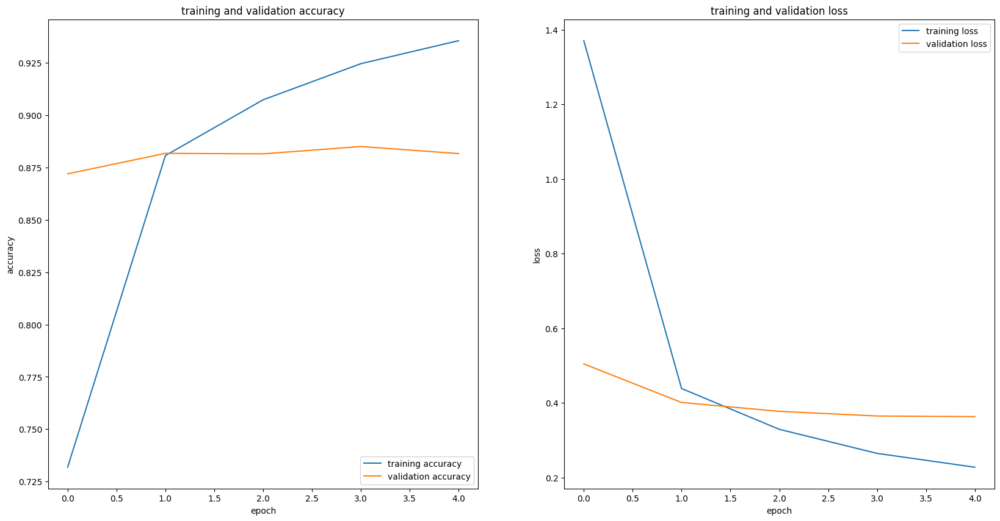

In [96]:
plot_model_loss_curves(history=history_1)

In [91]:
model_save_path = 'drive/MyDrive/dog breed id/models/dog_breed_id_model_version2.keras'

In [98]:
# model_1.save(filepath=model_save_path,
#              save_format="keras")

In [92]:
model_1 = tf.keras.models.load_model(filepath=model_save_path)

In [93]:
model_1_results = model_1.evaluate(test_ds)

269/269 ━━━━━━━━━━━━━━━━━━━━ 39s 85ms/step - accuracy: 0.8955 - loss: 0.3219


In [94]:
test_preds = model_1.predict(test_ds)

269/269 ━━━━━━━━━━━━━━━━━━━━ 26s 76ms/step


In [95]:
test_preds.shape

(8580, 120)

In [96]:
random.seed(42)
random_test_index = random.randint(0, test_preds.shape[0] - 1)
print(f"random test index: {random_test_index}")

random_test_pred_sample = test_preds[random_test_index]

print(f"random test pred sample shape: {random_test_pred_sample.shape}")
print(f"random test pred sample argmax: {tf.argmax(random_test_pred_sample)}")
print(f"random test pred sample label: {dog_names[tf.argmax(random_test_pred_sample)]}")
print(f"random test pred sample max prediction probability: {tf.reduce_max(random_test_pred_sample)}")
print(f"random test pred sample prediction probability values:\n{random_test_pred_sample}")

random test index: 1824
random test pred sample shape: (120,)
random test pred sample argmax: 24
random test pred sample label: brittany spaniel
random test pred sample max prediction probability: 0.9668603539466858
random test pred sample prediction probability values:
[8.41340750e-07 2.15559430e-05 8.11426844e-07 1.88553495e-05
 9.68389259e-07 4.10191433e-06 8.38832250e-07 1.82246106e-06
 2.62947196e-06 3.11455136e-04 8.44124315e-06 2.21128312e-06
 6.00310216e-07 6.01332460e-04 1.06554523e-06 6.45981754e-06
 4.17554747e-06 2.52042014e-06 3.39347098e-05 1.52149440e-07
 3.39898037e-07 1.27437636e-06 1.12532837e-06 1.39210465e-06
 9.66860354e-01 1.33068863e-06 4.36879958e-07 7.84588281e-07
 1.52038629e-05 1.75226523e-05 8.15795261e-07 2.36093561e-04
 6.33426098e-05 1.24596772e-05 1.85950842e-06 5.85123345e-08
 2.16655098e-06 2.01353259e-06 4.64812871e-07 8.45878036e-04
 2.46944819e-02 1.35188893e-04 3.97052054e-06 2.08501683e-06
 1.42740610e-05 1.85763241e-07 4.66816317e-07 6.33021467e-

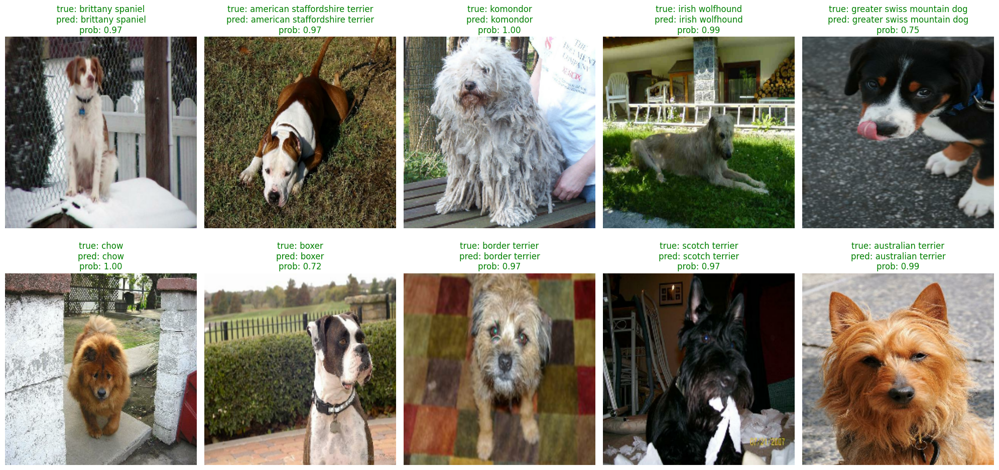

In [107]:
random.seed(42)
num_test_samples = 0
for batch_images, _ in test_ds:
    num_test_samples += batch_images.shape[0]

random_indexes = random.sample(range(num_test_samples), 10)

fig, axes = plt.subplots(2, 5, figsize=(20, 10))

current_index = 0
found = 0
for batch_images, batch_labels in test_ds:
    batch_size = batch_images.shape[0]

    for i in range(batch_size):
        global_index = current_index + i
        if global_index in random_indexes:
            test_image = batch_images[i].numpy()
            test_image_truth_label = class_names[tf.argmax(batch_labels[i])]

            test_image_input = np.expand_dims(test_image, axis=0)
            test_image_pred_probs = model_1.predict(test_image_input, verbose=0)[0]
            test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

            ax = axes.flatten()[random_indexes.index(global_index)]
            ax.imshow(test_image.astype("uint8"))
            title = f"true: {test_image_truth_label}\npred: {test_image_pred_class}\nprob: {np.max(test_image_pred_probs):.2f}"
            ax.set_title(title, color="green" if test_image_truth_label == test_image_pred_class else "red")
            ax.axis("off")

            found += 1
            if found == len(random_indexes):
                break
    current_index += batch_size
    if found == len(random_indexes):
        break

plt.tight_layout()
plt.show()

In [100]:
pred_labels = []
pred_probs = []
truth_labels = []

for batch_images, batch_labels in test_ds:
    batch_preds = model_1.predict(batch_images, verbose=0)

    batch_pred_labels = np.argmax(batch_preds, axis=-1)

    batch_pred_probs = np.max(batch_preds, axis=-1)

    batch_truth_labels = np.argmax(batch_labels.numpy(), axis=-1)

    pred_labels.extend(batch_pred_labels)
    pred_probs.extend(batch_pred_probs)
    truth_labels.extend(batch_truth_labels)

test_results_df = pd.DataFrame({
    "test_pred_label": pred_labels,
    "test_pred_prob": pred_probs,
    "test_pred_class_name": [class_names[i] for i in pred_labels],
    "test_truth_label": truth_labels,
    "test_truth_class_name": [class_names[i] for i in truth_labels]
})

test_results_df["correct"] = test_results_df["test_pred_class_name"] == test_results_df["test_truth_class_name"]

test_results_df.head()


,test_pred_label,test_pred_prob,test_pred_class_name,test_truth_label,test_truth_class_name,correct
0,0,0.967748,affenpinscher,0,affenpinscher,True
1,0,0.700830,affenpinscher,0,affenpinscher,True
2,0,0.991246,affenpinscher,0,affenpinscher,True
3,44,0.669176,flat coated retriever,0,affenpinscher,False
4,0,0.989764,affenpinscher,0,affenpinscher,True


In [101]:
accuracy_per_class = test_results_df.groupby("test_truth_class_name")["correct"].mean()

accuracy_per_class_df = pd.DataFrame(accuracy_per_class).reset_index().sort_values("correct", ascending=False)
accuracy_per_class_df.head()

,test_truth_class_name,correct
10,bedlington terrier,1.000000
62,keeshond,1.000000
30,chow,0.989583
2,african hunting dog,0.985507
45,french bulldog,0.983051


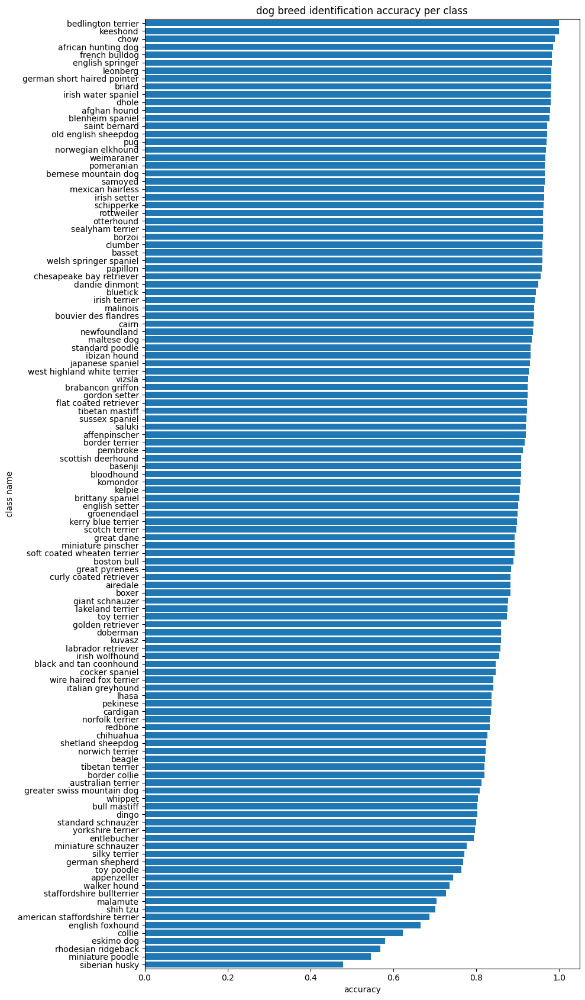

In [106]:
plt.figure(figsize=(10, 17))
plt.barh(y=accuracy_per_class_df["test_truth_class_name"],
         width=accuracy_per_class_df["correct"])
plt.xlabel("accuracy")
plt.ylabel("class name")
plt.title("dog breed identification accuracy per class")
plt.ylim(-0.5, len(accuracy_per_class_df["test_truth_class_name"]) - 0.5)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

In [103]:
accuracy_per_class_df.tail()

,test_truth_class_name,correct
33,collie,0.622642
43,eskimo dog,0.580000
90,rhodesian ridgeback,0.569444
76,miniature poodle,0.545455
101,siberian husky,0.478261


In [104]:
top_100_most_wrong = test_results_df[test_results_df["correct"] == 0].sort_values("test_pred_prob", ascending=False)[:100]
top_100_most_wrong.head()

,test_pred_label,test_pred_prob,test_pred_class_name,test_truth_label,test_truth_class_name,correct
5480,44,0.994846,flat coated retriever,78,newfoundland,False
2727,75,0.991934,miniature pinscher,38,doberman,False
7804,31,0.991860,clumber,107,sussex spaniel,False
6030,61,0.988807,japanese spaniel,85,pekinese,False
6884,54,0.988610,groenendael,95,schipperke,False


In [105]:
top_100_most_wrong.sample(n=10).index

Index([8023, 5480, 6462, 1265, 3022, 2364, 5560, 5216, 2794, 1234], dtype='int64')

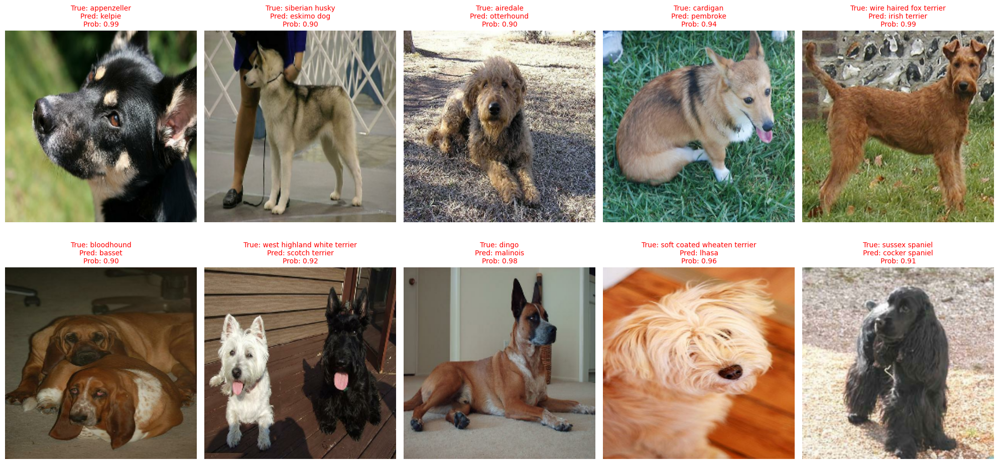

In [110]:
random_most_wrong_indexes = top_100_most_wrong.sample(n=10).index.tolist()

fig, axes = plt.subplots(2, 5, figsize=(20, 10))

current_index = 0
found = 0

for batch_images, batch_labels in test_ds:
    batch_size = batch_images.shape[0]

    for i in range(batch_size):
        global_index = current_index + i

        if global_index in random_most_wrong_indexes:
            test_image = batch_images[i].numpy()
            test_image_truth_label = class_names[tf.argmax(batch_labels[i])]

            test_image_input = np.expand_dims(test_image, axis=0)
            test_image_pred_probs = model_1.predict(test_image_input, verbose=0)[0]
            test_image_pred_class = class_names[tf.argmax(test_image_pred_probs)]

            ax = axes.flatten()[random_most_wrong_indexes.index(global_index)]
            ax.imshow(test_image.astype("uint8"))
            title = f"True: {test_image_truth_label}\nPred: {test_image_pred_class}\nProb: {np.max(test_image_pred_probs):.2f}"
            ax.set_title(title, color="green" if test_image_truth_label == test_image_pred_class else "red", fontsize=10)
            ax.axis("off")

            found += 1
            if found == len(random_most_wrong_indexes):
                break
    current_index += batch_size
    if found == len(random_most_wrong_indexes):
        break

plt.tight_layout()
plt.show()

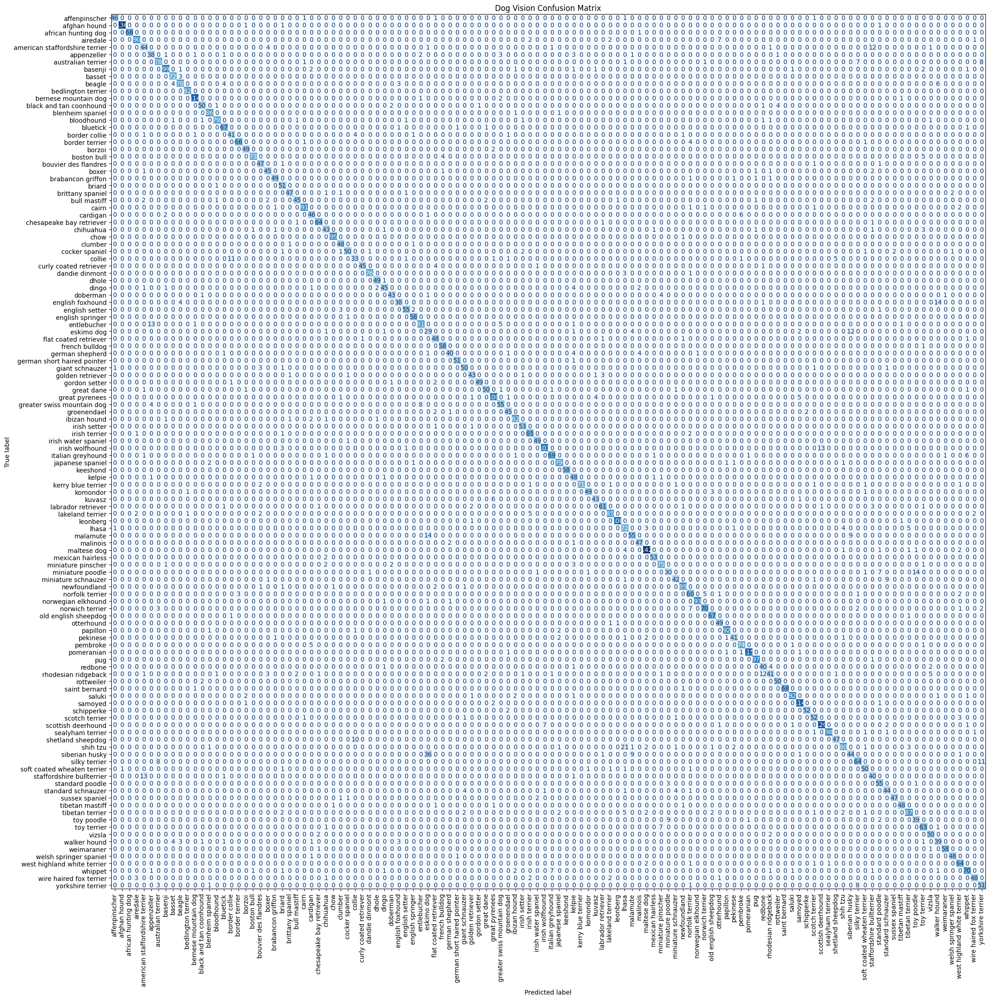

In [109]:
all_preds = []
all_truths = []

for batch_images, batch_labels in test_ds:
    batch_preds = model_1.predict(batch_images, verbose=0)

    batch_pred_labels = np.argmax(batch_preds, axis=-1)

    batch_truth_labels = np.argmax(batch_labels.numpy(), axis=-1)

    all_preds.extend(batch_pred_labels)
    all_truths.extend(batch_truth_labels)

confusion_matrix_dog_preds = confusion_matrix(y_true=all_truths, y_pred=all_preds)

confusion_matrix_display = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_dog_preds,
                                                  display_labels=class_names)

fig, ax = plt.subplots(figsize=(25, 25))
ax.set_title("Dog Vision Confusion Matrix")
confusion_matrix_display.plot(xticks_rotation="vertical",
                              cmap="Blues",
                              colorbar=False,
                              ax=ax)
plt.show()

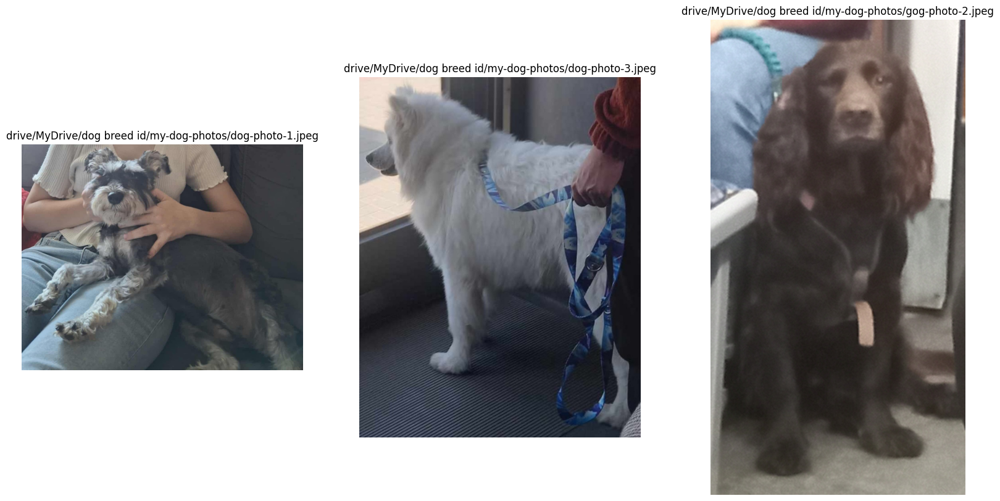

In [118]:
custom_path='drive/MyDrive/dog breed id/my-dog-photos/'
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]
fig, axes = plt.subplots(1, 3, figsize=(20, 10))
for i, ax in enumerate(axes.flatten()):
  ax.imshow(plt.imread(custom_image_paths[i]))
  ax.axis("off")
  ax.set_title(custom_image_paths[i])

In [120]:
os.chdir(custom_path)
custom_image = tf.keras.utils.load_img(
  path="dog-photo-1.jpeg",
  color_mode="rgb",
  target_size=IMG_SIZE,
)

type(custom_image), custom_image

(PIL.Image.Image, <PIL.Image.Image image mode=RGB size=224x224>)

In [121]:
custom_image_tensor = tf.keras.utils.img_to_array(custom_image)
custom_image_tensor.shape

(224, 224, 3)

In [122]:
print(f"shape of custom image tensor: {np.array([custom_image_tensor]).shape}")
print(f"shape of custom image tensor: {tf.expand_dims(custom_image_tensor, axis=0).shape}")

shape of custom image tensor: (1, 224, 224, 3)
shape of custom image tensor: (1, 224, 224, 3)


In [123]:
pred_probs = model_1.predict(tf.expand_dims(custom_image_tensor, axis=0))
pred_probs

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


array([[1.9917037e-05, 4.0726864e-06, 2.8964209e-06, 9.6613221e-06,
        6.9898706e-06, 3.3581805e-06, 1.0306109e-06, 1.7892763e-06,
        1.9074469e-06, 6.5680945e-07, 5.3143281e-06, 3.6446447e-06,
        4.7564353e-07, 2.8663292e-06, 1.7509116e-07, 6.6887569e-06,
        5.6265762e-06, 2.4063800e-06, 2.6344060e-06, 1.0241491e-04,
        2.4659032e-05, 1.6594066e-05, 3.6768397e-06, 6.7968440e-06,
        1.2714529e-06, 1.1660667e-06, 1.1013445e-05, 1.2391165e-06,
        1.5518920e-07, 1.3426120e-06, 1.2715730e-06, 5.8672663e-07,
        1.4260218e-05, 5.5587184e-06, 2.9147495e-07, 2.8809787e-05,
        2.1344681e-07, 3.8180050e-07, 3.0162912e-06, 9.1296954e-07,
        4.7714443e-06, 3.0477831e-06, 6.4864622e-07, 2.0843147e-06,
        1.3301186e-06, 5.7584693e-06, 1.2992457e-06, 1.3057446e-06,
        1.1693324e-03, 1.1373289e-06, 5.5296402e-07, 2.6061602e-05,
        1.6355168e-06, 3.2377982e-06, 4.8512288e-07, 4.2507671e-07,
        2.5407627e-07, 3.7012684e-05, 1.5158210e

In [124]:
pred_label = tf.argmax(pred_probs, axis=-1).numpy()[0]

pred_class_name = class_names[pred_label]

print(f"Predicted class label: {pred_label}")
print(f"Predicted class name: {pred_class_name}")

Predicted class label: 77
Predicted class name: miniature schnauzer


In [125]:
def pred_on_custom_image(image_path: str,
                         model,
                         target_size: tuple[int, int] = (224, 224),
                         class_names: list = None,
                         plot: bool = True):

  custom_image = tf.keras.utils.load_img(
    path=image_path,
    color_mode="rgb",
    target_size=target_size,
  )

  custom_image_tensor = tf.keras.utils.img_to_array(custom_image)

  custom_image_tensor = tf.expand_dims(custom_image_tensor, axis=0)

  pred_probs = model.predict(custom_image_tensor)

  pred_class = class_names[tf.argmax(pred_probs, axis=-1).numpy()[0]]

  if not plot:
    return pred_class, pred_probs
  else:
    plt.figure(figsize=(5, 3))
    plt.imshow(plt.imread(image_path))
    plt.title(f"pred: {pred_class}\nprob: {tf.reduce_max(pred_probs):.2f}")
    plt.axis("off")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


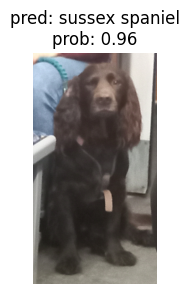

In [126]:
pred_on_custom_image(image_path="dog-photo-2.jpeg",
                     model=model_1,
                     class_names=class_names)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


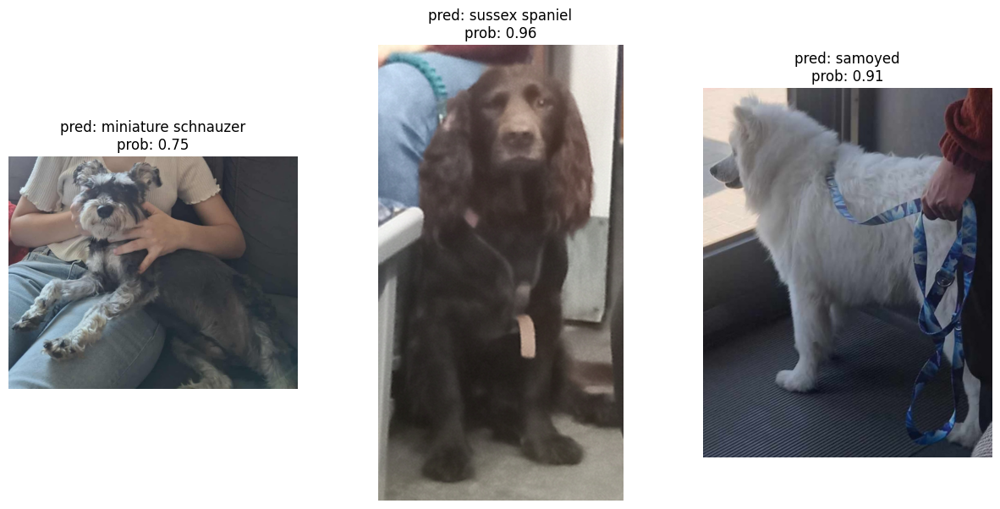

In [135]:
custom_path = '/content/drive/MyDrive/dog breed id/my-dog-photos/'
custom_filenames = ["dog-photo-1.jpeg", "dog-photo-2.jpeg", "dog-photo-3.jpeg"]

fig, axes = plt.subplots(1, 3, figsize=(15, 7))
for i, ax in enumerate(axes.flatten()):
    full_path = os.path.join(custom_path, custom_filenames[i])

    pred_class, pred_probs = pred_on_custom_image(
        image_path=full_path,
        model=model_1,
        class_names=class_names,
        plot=False
    )

    ax.imshow(plt.imread(full_path))
    ax.set_title(f"pred: {pred_class}\nprob: {tf.reduce_max(pred_probs):.2f}")
    ax.axis("off")


In [1]:
# !pip install -q gradio
# import gradio as gr

In [2]:
# !wget -q https://huggingface.co/spaces/JankData/dog-breed-identification-classification/resolve/main/dog_breed_id_model_version2.keras
# !wget -q https://huggingface.co/spaces/JankData/dog-breed-identification-classification/resolve/main/doggo_class_names.txt

In [3]:
# %%writefile app.py
# import gradio as gr
# import tensorflow as tf

# model_save_path = 'dog_breed_id_model_version2.keras'
# loaded_model = tf.keras.models.load_model(model_save_path)

# with open('doggo_class_names.txt', 'r') as f:
#   class_names = [line.strip() for line in f.readlines()]

# def pred_on_custom_image(image,
#                          model: tf.keras.Model =loaded_model,
#                          target_size: int = 224,
#                          class_names: list = class_names):

#   resize = tf.keras.layers.Resizing(height=target_size,
#                                     width=target_size)

#   custom_image_tensor = resize(tf.keras.utils.img_to_array(image))

#   custom_image_tensor = tf.expand_dims(custom_image_tensor, axis=0)

#   pred_probs = model.predict(custom_image_tensor)[0]

#   pred_probs_dict = {class_names[i]: float(pred_probs[i]) for i in range(len(class_names))}

#   return pred_probs_dict

# interface_title = "Doggo Identification"
# interface_description = """Upload a clear photo of a dog.
# The model will identify the top 3 breeds and show the confidence of each prediction using deep learning.

# This model was trained with TensorFlow/Keras.
# For the full source code and details, check out my GitHub:
# https://github.com/JankData/dog-breed-identification-classification
# """
# interface = gr.Interface(fn=pred_on_custom_image,
#                          inputs=gr.Image(),
#                          outputs=gr.Label(num_top_classes=3),
#                          examples=["dog-photo-1.jpeg",
#                                     "dog-photo-2.jpeg",
#                                     "dog-photo-3.jpeg"],
#                          title=interface_title,
#                          description=interface_description)
# interface.launch(debug=True)